In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv
import sys
sys.path.append('../../../MultiVeloVAE/')
import multivelovae as vv

In [2]:
scv.settings.verbosity = 3
scv.settings.presenter_view = True
scv.set_figure_params('scvelo')
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 200)
np.set_printoptions(suppress=True)

In [3]:
adata_ = sc.read_h5ad('8489-MV-1/8489-MV-1_adata_prepro.h5ad')
adata_atac_ = sc.read_h5ad('8489-MV-1/8489-MV-1_adata_atac_prepro.h5ad')
adata2_ = sc.read_h5ad('9060-MV-3/9060-MV-3_adata_prepro.h5ad')
adata_atac2_ = sc.read_h5ad('9060-MV-3/9060-MV-3_adata_atac_prepro.h5ad')

In [4]:
adata_.layers['counts'] = adata_.X.copy()
adata2_.layers['counts'] = adata2_.X.copy()

In [5]:
scv.pp.normalize_per_cell(adata_)
scv.pp.normalize_per_cell(adata2_)
vv.model.tfidf_norm(adata_atac_)
vv.model.tfidf_norm(adata_atac2_)

Normalized count data: X, spliced, unspliced.
Normalized count data: X, spliced, unspliced.


In [6]:
shared_genes = pd.Index(np.intersect1d(adata_.var_names, adata2_.var_names))
shared_genes

Index(['AACS', 'AAGAB', 'AAK1', 'AAMDC', 'AARS', 'AARSD1', 'AASDH', 'AASDHPPT',
       'AASS', 'AATF',
       ...
       'ZSWIM7', 'ZSWIM8', 'ZSWIM9', 'ZUP1', 'ZW10', 'ZWILCH', 'ZXDC',
       'ZYG11B', 'ZYX', 'ZZEF1'],
      dtype='object', length=7813)

In [7]:
adata = sc.read_h5ad('8489-MV-1/8489-MV-1_adata_postpro.h5ad')
adata_atac = sc.read_h5ad('8489-MV-1/8489-MV-1_adata_atac_postpro.h5ad')
adata2 = sc.read_h5ad('9060-MV-3/9060-MV-3_adata_postpro.h5ad')
adata_atac2 = sc.read_h5ad('9060-MV-3/9060-MV-3_adata_atac_postpro.h5ad')

In [8]:
adata, adata2

(AnnData object with n_obs × n_vars = 6336 × 816
     obs: 'total_unspliced', 'total_spliced', 'log1p_total_unspliced', 'log1p_total_spliced', 'fraction_u', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'log1p_total_counts_rb', 'pct_counts_rb', 'total_counts_hla', 'log1p_total_counts_hla', 'pct_counts_hla', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'S_score', 'G2M_score', 'phase', 'CC_difference', 'total_unspliced2', 'total_spliced2', 'log1p_total_unspliced2', 'log1p_total_spliced2', 'fraction_u2', 'n_c', 'n_Mu', 'n_Ms', 'leiden'
     var: 'gene_ids', 'feature_types', 'HVG', 'n_cells', 'mt', 'rb', 'hla', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'gen

In [9]:
all_genes = pd.Index(np.union1d(adata.var_names, adata2.var_names))
all_genes

Index(['ABCA1', 'ABCA13', 'ABCB10', 'ABCC3', 'ABCC4', 'ABHD2', 'ABHD4', 'ABO',
       'AC004540.1', 'AC004540.2',
       ...
       'ZFPM1', 'ZFYVE16', 'ZFYVE28', 'ZMAT3', 'ZNF385D', 'ZNF438', 'ZNF521',
       'ZNF608', 'ZSWIM6', 'ZYX'],
      dtype='object', length=1201)

In [10]:
shared_genes = shared_genes[np.isin(shared_genes, all_genes)]
shared_genes

Index(['ABCA1', 'ABCA13', 'ABCB10', 'ABCC3', 'ABCC4', 'ABHD2', 'ABO',
       'AC004540.1', 'AC007262.2', 'AC008568.1',
       ...
       'ZFP36L2', 'ZFPM1', 'ZFYVE16', 'ZMAT3', 'ZNF385D', 'ZNF438', 'ZNF521',
       'ZNF608', 'ZSWIM6', 'ZYX'],
      dtype='object', length=929)

In [11]:
np.sum(np.isin(adata.var_names, shared_genes)), np.sum(np.isin(adata2.var_names, shared_genes))

(693, 595)

In [12]:
'PROM1' in shared_genes

True

In [13]:
'PROM1' in all_genes

True

In [14]:
adata_ = adata_[adata.obs_names, shared_genes].copy()
adata_atac_ = adata_atac_[adata.obs_names, shared_genes].copy()
adata2_ = adata2_[adata2.obs_names, shared_genes].copy()
adata_atac2_ = adata_atac2_[adata2.obs_names, shared_genes].copy()

In [15]:
adata_.obs = adata.obs
adata_.var['highly_variable'] = False
adata_.var['highly_variable'][np.isin(adata_.var_names, adata.var_names)] = True
print(np.sum(adata_.var['highly_variable']))
adata_.var['highly_variable'][np.sum(adata_.X.A > 0, axis=0) >= (0.1 * adata_.shape[0])] = True
print(np.sum(adata_.var['highly_variable']))
adata2_.obs = adata2.obs
adata2_.var['highly_variable'] = False
adata2_.var['highly_variable'][np.isin(adata2_.var_names, adata2.var_names)] = True
print(np.sum(adata2_.var['highly_variable']))
adata2_.var['highly_variable'][np.sum(adata2_.X.A > 0, axis=0) >= (0.1 * adata2_.shape[0])] = True
print(np.sum(adata2_.var['highly_variable']))

693
814
595
785


In [16]:
nn_idx = np.loadtxt("8489-MV-1/seurat/nn_idx.txt", delimiter=',')
nn_dist = np.loadtxt("8489-MV-1/seurat/nn_dist.txt", delimiter=',')
vv.model.knn_smooth_chrom(adata_atac_, nn_idx, nn_dist)
adata_atac_.layers['Mc'] = adata_atac_.layers['Mc'].A
nn_idx = np.loadtxt("9060-MV-3/seurat/nn_idx.txt", delimiter=',')
nn_dist = np.loadtxt("9060-MV-3/seurat/nn_dist.txt", delimiter=',')
vv.model.knn_smooth_chrom(adata_atac2_, nn_idx, nn_dist)
adata_atac2_.layers['Mc'] = adata_atac2_.layers['Mc'].A

In [17]:
counts_c = adata_atac_.X[:,adata_.var['highly_variable']].sum(1).A1
counts_u = adata_.layers['unspliced'][:,adata_.var['highly_variable']].sum(1).A1
counts_s = adata_.layers['spliced'][:,adata_.var['highly_variable']].sum(1).A1
adata_.obs['total_chromatin'] = counts_c
adata_.obs['total_unspliced3'] = counts_u
adata_.obs['total_spliced3'] = counts_s
adata_.obs['log1p_total_unspliced3'] = np.log1p(counts_u)
adata_.obs['log1p_total_spliced3'] = np.log1p(counts_s)
adata_.obs['fraction_u3'] = counts_u / (counts_s + counts_u)

counts_c = adata_atac2_.X[:,adata2_.var['highly_variable']].sum(1).A1
counts_u = adata2_.layers['unspliced'][:,adata2_.var['highly_variable']].sum(1).A1
counts_s = adata2_.layers['spliced'][:,adata2_.var['highly_variable']].sum(1).A1
adata2_.obs['total_chromatin'] = counts_c
adata2_.obs['total_unspliced3'] = counts_u
adata2_.obs['total_spliced3'] = counts_s
adata2_.obs['log1p_total_unspliced3'] = np.log1p(counts_u)
adata2_.obs['log1p_total_spliced3'] = np.log1p(counts_s)
adata2_.obs['fraction_u3'] = counts_u / (counts_s + counts_u)

In [18]:
sc.pp.log1p(adata_)
sc.pp.regress_out(adata_, ['CC_difference'])
sc.pp.scale(adata_)
scv.pp.moments(adata_, n_pcs=30, n_neighbors=30)
sc.pp.log1p(adata2_)
sc.pp.regress_out(adata2_, ['CC_difference'])
sc.pp.scale(adata2_)
scv.pp.moments(adata2_, n_pcs=30, n_neighbors=30)

computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [19]:
counts_c = adata_atac_.layers['Mc'][:,adata_.var['highly_variable']].sum(1)
counts_u = adata_.layers['Mu'][:,adata_.var['highly_variable']].sum(1)
counts_s = adata_.layers['Ms'][:,adata_.var['highly_variable']].sum(1)
adata_.obs['total_Mc'] = counts_c
adata_.obs['total_Mu'] = counts_u
adata_.obs['total_Ms'] = counts_s

counts_c = adata_atac2_.layers['Mc'][:,adata2_.var['highly_variable']].sum(1)
counts_u = adata2_.layers['Mu'][:,adata2_.var['highly_variable']].sum(1)
counts_s = adata2_.layers['Ms'][:,adata2_.var['highly_variable']].sum(1)
adata2_.obs['total_Mc'] = counts_c
adata2_.obs['total_Mu'] = counts_u
adata2_.obs['total_Ms'] = counts_s

In [20]:
adata_concat = adata_.concatenate(adata2_, batch_categories=['Day 7', 'Day 14'])
adata_atac_concat = adata_atac_.concatenate(adata_atac2_, batch_categories=['Day 7', 'Day 14'])
adata_concat, adata_atac_concat

(AnnData object with n_obs × n_vars = 9908 × 929
     obs: 'total_unspliced', 'total_spliced', 'log1p_total_unspliced', 'log1p_total_spliced', 'fraction_u', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'log1p_total_counts_rb', 'pct_counts_rb', 'total_counts_hla', 'log1p_total_counts_hla', 'pct_counts_hla', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'S_score', 'G2M_score', 'phase', 'CC_difference', 'total_unspliced2', 'total_spliced2', 'log1p_total_unspliced2', 'log1p_total_spliced2', 'fraction_u2', 'n_c', 'n_Mu', 'n_Ms', 'leiden', 'total_chromatin', 'total_unspliced3', 'total_spliced3', 'log1p_total_unspliced3', 'log1p_total_spliced3', 'fraction_u3', 'total_Mc', 'total_Mu', 'total_Ms', 'batch'
     var: 'gene_ids', 'feature_types', 

In [21]:
sc.pp.neighbors(adata_concat, n_pcs=30, n_neighbors=30)
scv.tl.umap(adata_concat)

/home/chen/.mambaforge/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


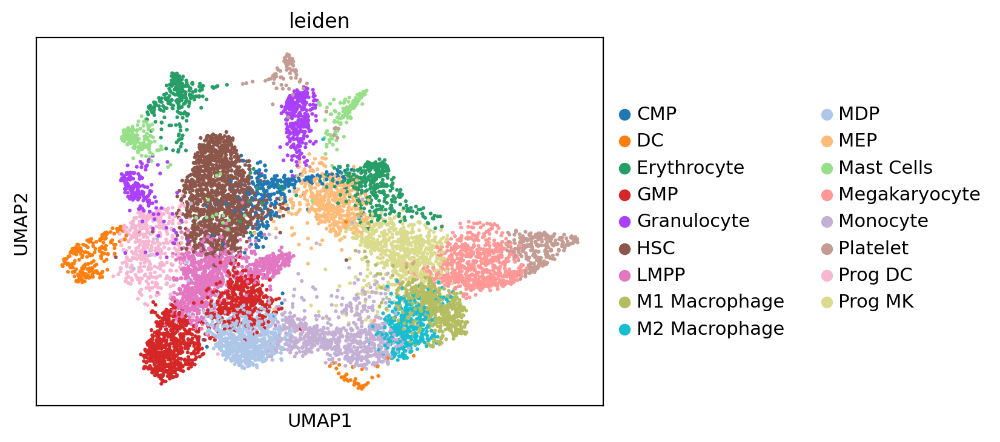

/home/chen/.mambaforge/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


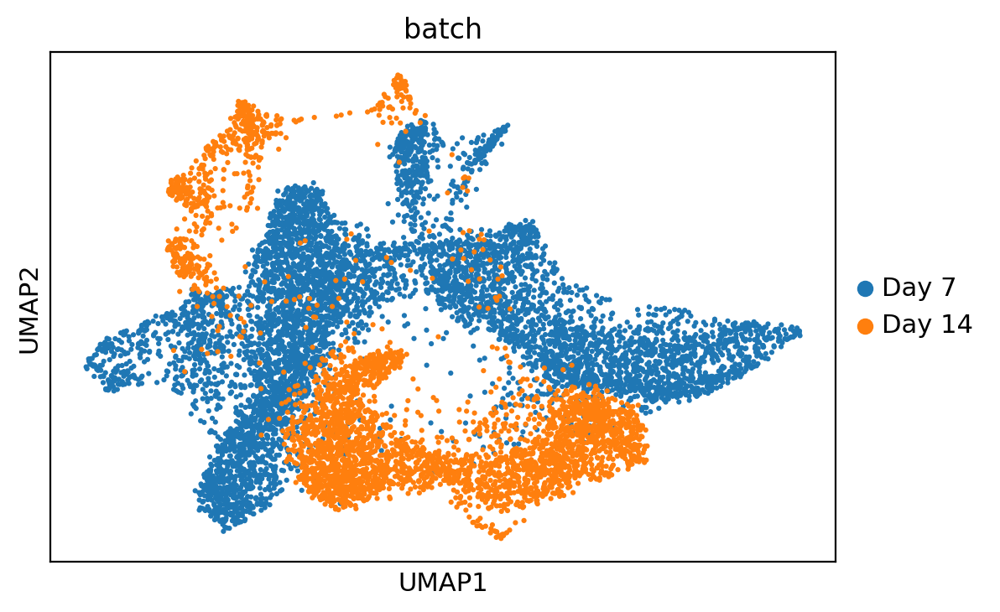

In [22]:
sc.pl.umap(adata_concat, color='leiden', s=20)
sc.pl.umap(adata_concat, color='batch', s=20)

/home/chen/.mambaforge/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


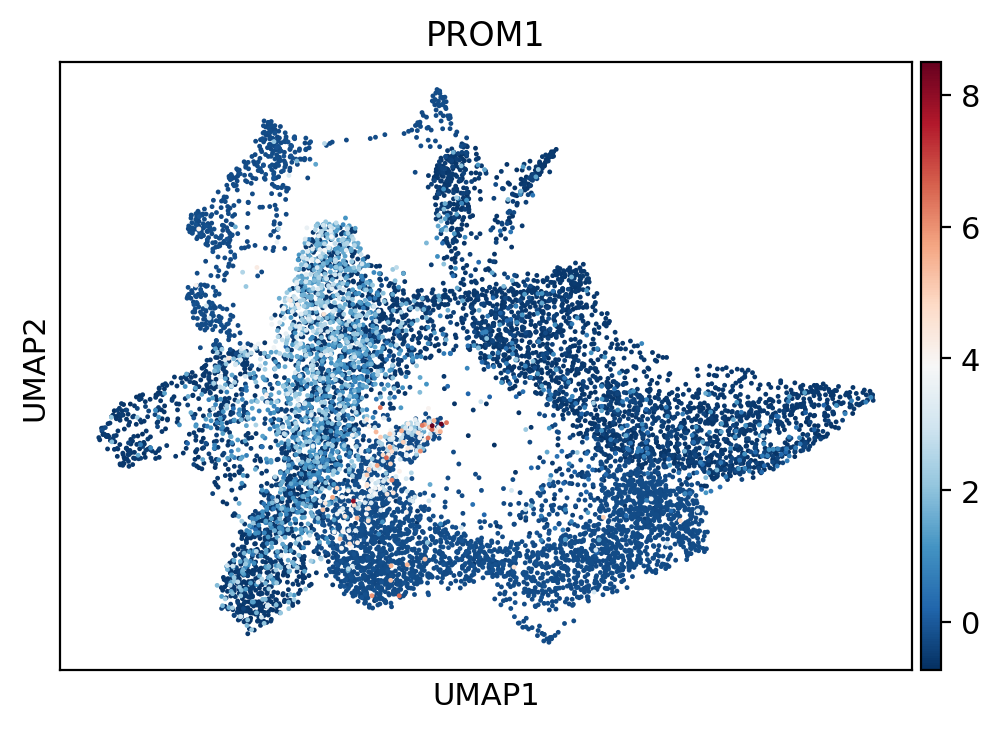

In [23]:
sc.pl.umap(adata_concat, color='PROM1')

In [24]:
adata_concat.obs['n_Mc'] = adata_atac_concat.layers['Mc'].sum(1)
adata_concat.obs['n_Mu'] = np.sum(adata_concat.layers['Mu'], 1)
adata_concat.obs['n_Ms'] = np.sum(adata_concat.layers['Ms'], 1)

/home/chen/.mambaforge/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:163: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = copy(get_cmap(cmap))


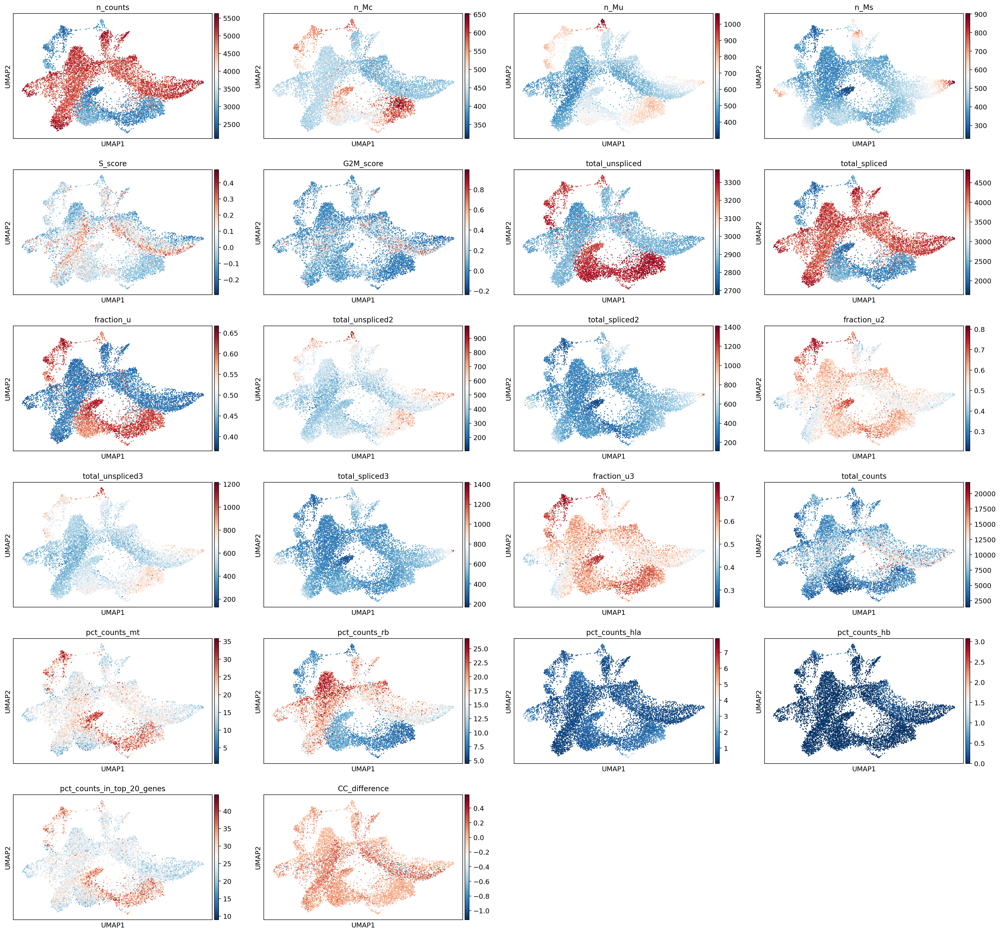

In [25]:
sc.pl.umap(adata_concat, color=['n_counts', 'n_Mc', 'n_Mu', 'n_Ms',
                                'S_score', 'G2M_score', 'total_unspliced', 'total_spliced',
                                'fraction_u', 'total_unspliced2', 'total_spliced2', 'fraction_u2',
                                'total_unspliced3', 'total_spliced3', 'fraction_u3',
                                'total_counts', 'pct_counts_mt', 'pct_counts_rb', 'pct_counts_hla',
                                'pct_counts_hb', 'pct_counts_in_top_20_genes', 'CC_difference'])

In [26]:
adata_concat

AnnData object with n_obs × n_vars = 9908 × 929
    obs: 'total_unspliced', 'total_spliced', 'log1p_total_unspliced', 'log1p_total_spliced', 'fraction_u', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'log1p_total_counts_rb', 'pct_counts_rb', 'total_counts_hla', 'log1p_total_counts_hla', 'pct_counts_hla', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'S_score', 'G2M_score', 'phase', 'CC_difference', 'total_unspliced2', 'total_spliced2', 'log1p_total_unspliced2', 'log1p_total_spliced2', 'fraction_u2', 'n_c', 'n_Mu', 'n_Ms', 'leiden', 'total_chromatin', 'total_unspliced3', 'total_spliced3', 'log1p_total_unspliced3', 'log1p_total_spliced3', 'fraction_u3', 'total_Mc', 'total_Mu', 'total_Ms', 'batch', 'n_Mc'
    var: 'gene_ids', 'feature_typ

In [27]:
adata_concat.write("../macrophage/8489-MV-1-9060-MV-3_adata_postpro_concat.h5ad")
adata_atac_concat.write("../macrophage/8489-MV-1-9060-MV-3_adata_atac_postpro_concat.h5ad")